First, we load the necessary packages. To ensure you install the correct version for this notbook, we recommend you double check the `requirements.txt` file in this repository. You can install the packages using pip:
```bash
pip install -r requirements.txt
```

In [1]:
# basic packages for data science in python
import pandas as pd 
import numpy as np

# visualization
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from plotly.subplots import make_subplots
import plotly.graph_objects as go

#turn off the warning
import warnings
warnings.filterwarnings('ignore')
import copy

# additional packages for data analysis
import country_converter as coco
from py_pcha import PCHA
from adjustText import adjust_text
from sympy import true
from sklearn.decomposition import PCA
from scipy.spatial import ConvexHull
from kneed import KneeLocator

# load the autoreload extension
%load_ext autoreload
%autoreload 2

All temporal clustering methods can be find in the online avilable `PyPl` release: `tscluster`. We also provided a copy of this packages in the folder `tscluster` in this repository.

We next load the necessary functions from the `tscluster` package:

In [2]:
# temporal clustering schemes from the online avilable `PyPl` release: tscluster
from tscluster.opttscluster import OptTSCluster
from tscluster.greedytscluster import GreedyTSCluster
from tscluster.tsplot import plots
from tscluster.tskmeans import TSGlobalKmeans
# a series of helper functions available in 'helper.py'
import helper as hp

## Case Study: State-level Spatiotemporal Polarization

Our analysis examines changes in policy views, attitudes, and partisanship across different states over the past seventy years (1946-2014). The temporal data was collected by the Correlates of State Policy Project (CSPP)~\citep{Grossmann_Jordan_McCrain_2021}, a comprehensive and publicly accessible database covering over 3,000 state policies and politics-related variables from various sources spanning seven decades. We selected five features from the CSPP for analysis. One key feature is the ratio between the proportion of Democratic and Republican identifiers in each state, indicating residents' political affiliations. A ratio greater than one indicates a larger proportion of Democratic identifiers than Republican identifiers, while a ratio less than one suggests the opposite.\endnote{This feature is derived by dividing an "over-time measure of the percent of Democratic identifiers in each state" (`democrat` in the CSPP variable codebook Version 2.4.1) by an over-time measure of the percent of Republican identifiers in each state (`republican`).
 

We also included four CSPP measures of estimated policy and mass resident liberalism in each state. These features consist of measures of social and economic policy liberalism at the state level (`policysociallib_est` and `policyeconlib_est` in the CSPP codebook) as well as estimates of mass social and economic liberalism among state residents (`masssociallib_est` and ``masseconlib\_est''). The estimates of mass liberalism are constructed using public opinion surveys weighted by the proportion of identifiers in different parties

### Dataset Loading

 The temporal dataset spans yearly data for the five features from 1946 to 2014 across all 50 states. For Alaska and Hawaii, which became states in 1959, data from 1949 to 1958 were imputed using the values from their first available year (1959). We observed common trends among all states in certain features, such as a general increasing trend in the mass social liberalism over the duration of the dataset. We applied z-score normalization separately per feature per year to eliminate these common trends and facilitate easier identification of notable temporal trends within entities. 

In [4]:

#loaded the cleaned datasets
data = pd.read_csv('data/spatiotemporal_polarization_cleaned.csv')
# retreived the normalized 1 for the ratio between the Democrate and Republican Proportion
divided_line =  data[data['state'] == 'divided_line']['Ratio between the Democrate and Republican Proportion'].to_numpy()
# drop the row that is the divided_line
data = data[data['state'] != 'divided_line']

# loading the cleaned entities names, time points names, and features
state_name = data['state'].unique()
year = data['year'].unique()
features = ['Relative Proportion Democrat vs. Republican',
            'Social Policy Liberalism ', 'Economic Policy Liberalism', 
            'Mass Resident Social Liberalism', 'Mass Resident Economic Liberalism']

# creating a dictionary to map the entities names, time points names, and features to the corresponding indices
label_dict = {'T': year,
                'N': state_name,
                'F': features}

# convert the data into a numpy array that consist the features of each state in each year only
blue_red = np.empty((data['year'].nunique(), data['state'].nunique(), 5))
for t, year in enumerate(data['year'].unique()):
    for n, countries in enumerate(data['state'].unique()):
        tem = data[(data['year'] == year) & (data['state'] == countries)]
        tem = tem.drop(columns=['year', 'state'])
        tem = tem.values[0]
        blue_red[t][n] = tem

# check shape of the numpy array
print(blue_red.shape)

(69, 50, 5)


### Number of cluster

To determine the appropriate number of clusters \( K \), we measured the clustering objectives for different values of \( K \) and selected \( K = 6 \) based on the diminishing reduction of the objective (the elbow method).

Text(0.5, 1.0, 'Sum of Distance in different number of clusters using TSC')

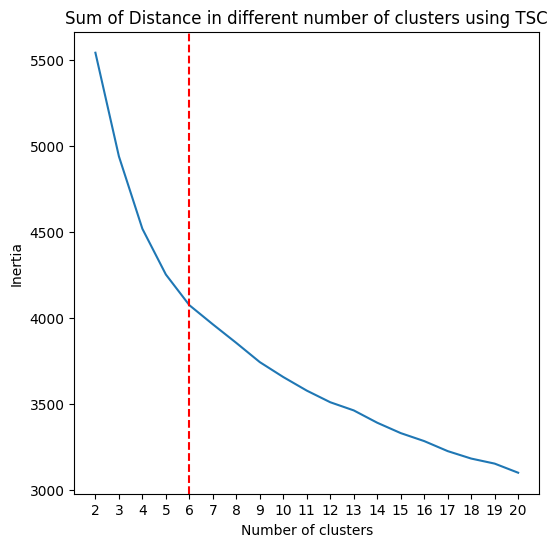

In [ ]:
sse = []
# using the GreedyTSCluster to find the optimal number of clusters by running the algorithm for different number of clusters
for c in range(2, 21):
    model_greedy = GreedyTSCluster(n_clusters=c, scheme='z0c1',
                        random_state=42)
    model_greedy.fit(blue_red, verbose=False)
    sse.append(model_greedy.sum_of_distance)

plt.figure(figsize=(6,6))

plt.plot(np.arange(2,21), sse)
KL = KneeLocator(np.arange(2,21), sse, curve='convex', direction='decreasing')
plt.axvline(KL.knee.astype(int), color='red', linestyle='--')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.xticks(np.arange(2,21))
plt.title('Sum of Distance in different number of clusters using TSC')
plt.show()

### Dynamic Clustering with Bounded Changes

Dynamic Clustering with 6 clusters setting and 3 maximum changes in cluster labels

In [198]:
state_name = data['state'].unique()
year = data['year'].unique()
features = data.columns[2:]
model_bdc = GreedyTSCluster(n_clusters=6, scheme='z1c1', random_state=42,
                            bound_scheme = 'hard',n_allow_assignment_change=3)
model_bdc.fit(blue_red, label_dict = label_dict, verbose=True)

Starting fitting...
Initialization with kmeans++, Sum of Distance: 9862.6482, Max Distance: 4.9469
Iteration 1, Sum of distance: 5854.0991, Max distance: 3.6476, Number of change: 3
Iteration 6, Sum of distance: 5790.2247, Max distance: 3.5742, Number of change: 0
Converged at iteration 7, Sum of distance: 5790.2247, Max distance: 3.5742


Cluster definition will be a 3 dimensional array, the first dimension is the number of time points, the second dimension is the number of clusters, the third dimension is the number of features

In [199]:
model_bdc.Zs.shape

(69, 6, 5)

In [200]:
model_bdc.Zs

array([[[-0.58267332,  0.3071457 ,  0.2593254 ,  0.4123092 ,
          0.30912248],
        [-0.2870239 , -0.77428713, -0.62335561, -1.17795648,
         -1.00090259],
        [-0.13917839, -0.357008  , -0.18339976, -0.19616735,
         -0.36512987],
        [-0.20848044,  1.2030474 ,  1.01639704,  1.27564136,
          0.89570796],
        [ 1.73345648, -0.7151818 , -0.98823734, -1.15127375,
         -0.7425252 ],
        [-0.70632997, -0.33102251,  0.11598247, -0.18121496,
          0.31454241]],

       [[-0.57936336,  0.36941609,  0.229085  ,  0.38272057,
          0.3434597 ],
        [-0.28662392, -0.80435026, -0.78099452, -1.27664358,
         -0.56590993],
        [-0.14409568, -0.40527781, -0.22824449, -0.17632791,
         -0.39389127],
        [-0.21172291,  1.18153978,  1.13645911,  1.22484589,
          0.97341477],
        [ 1.73520384, -0.71015145, -0.94781607, -1.15383415,
         -0.75108743],
        [-0.70191363, -0.35214925,  0.10648093, -0.02062511,
          0.0

To visualize the cluster definition (cf. Figure 4 of the manuscript)

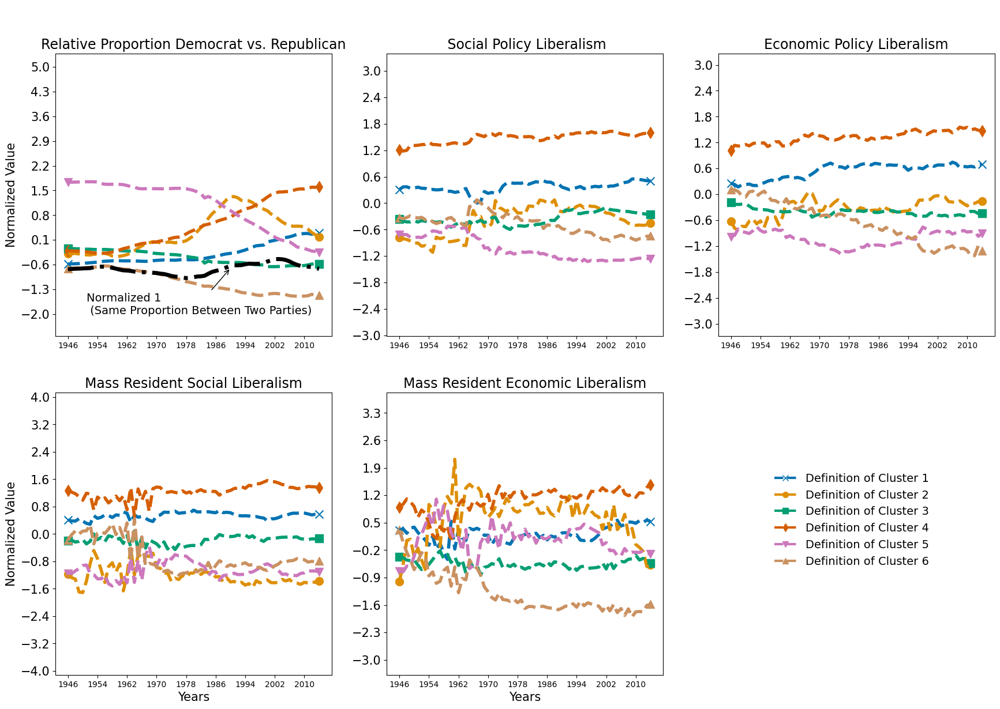

In [204]:

plt.rcParams.update({'axes.labelsize': 15,
                    'axes.titlesize': 17,
                    'xtick.labelsize': 10,
                    'ytick.labelsize': 15})

fig, axes = plots(model = copy.deepcopy(model_bdc), 
show_cluster_center_only=True,bbox_to_anchor=(2, 0.75), 
loc='upper left', show_annotations=False)

axes[0, 0].plot(range(len(data['year'].unique())), divided_line, lw = 5, ls = '-.', color = 'black')
for i , ax in enumerate(axes):
    for j , a in enumerate(ax):
        if j == 0:
            a.set_ylabel('Nomalized Value', fontsize=15)
        else:
            a.set_ylabel('')
        if i == 1:
            a.set_xlabel('Years', fontsize=15)
        else:
            a.set_xlabel('')
axes[0,0].annotate('Normalized 1 \n (Same Proportion Between Two Parties)', xy = (len(data['year'].unique()) - 25, divided_line[-2]),
                    xytext = (5, -2),
                    arrowprops = dict(facecolor = 'black', arrowstyle = '->'), fontsize = 14)
for i , ax in enumerate(axes):
    for j , a in enumerate(ax):
        if j == 0:
            a.set_ylabel('Normalized Value', fontsize=15)
        else:
            a.set_ylabel('')
        if i == 1:
            a.set_xlabel('Years', fontsize=15)
        else:
            a.set_xlabel('')
axes[0,1].set_title('\n \n Social Policy Liberalism', fontsize=17)
axes[1,2].axis('off')
plt.show()

We can also visualize the time series of each entity by cluster (cf. Appendix C)

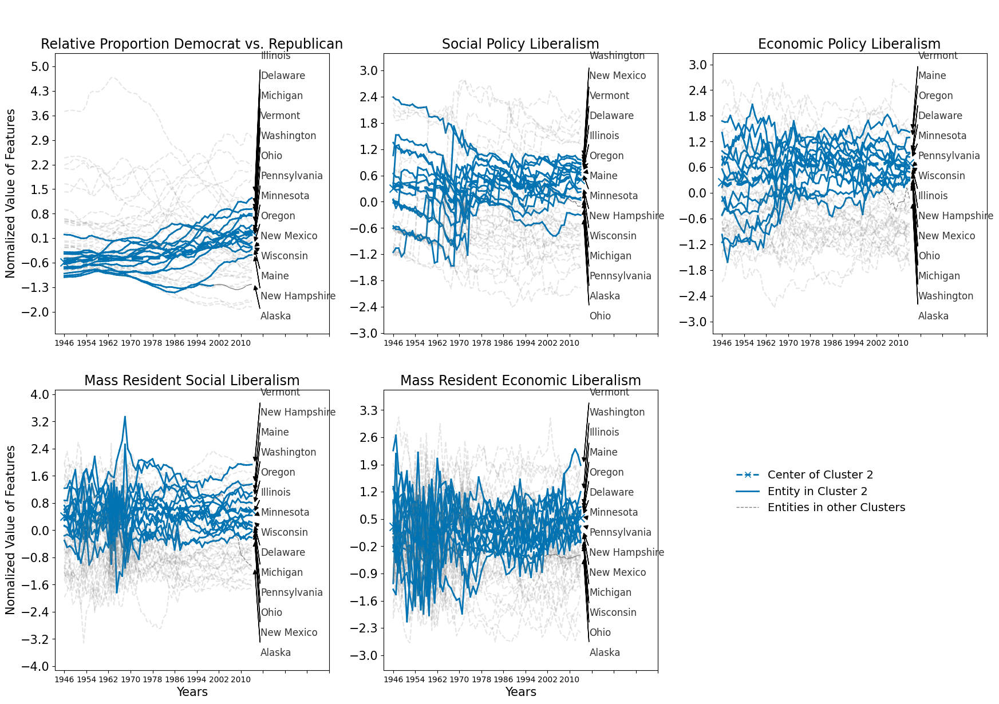

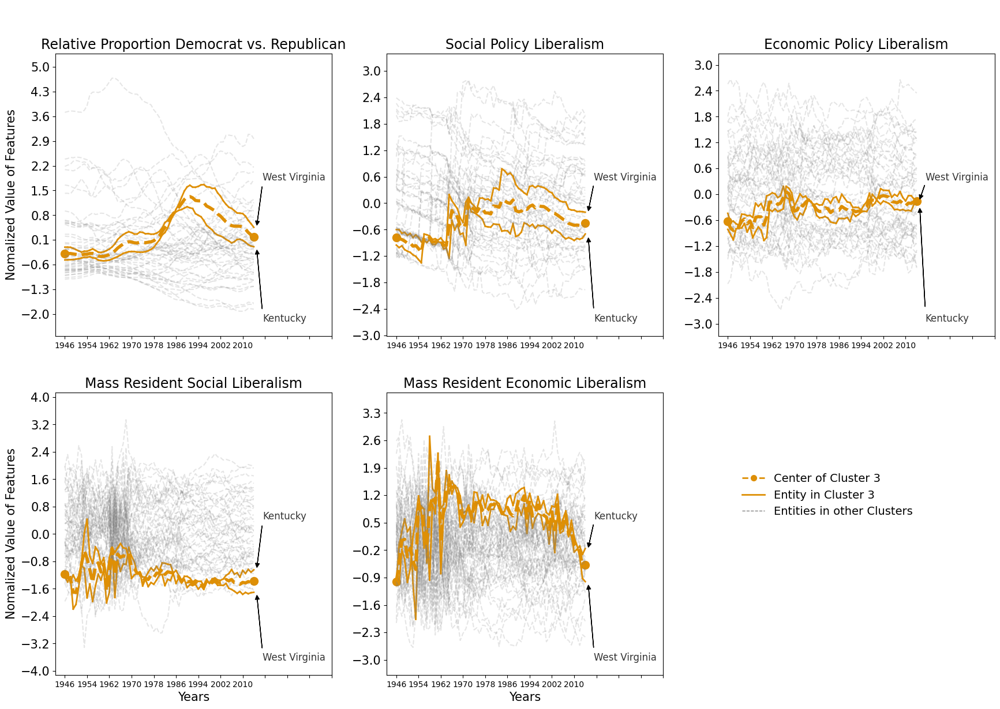

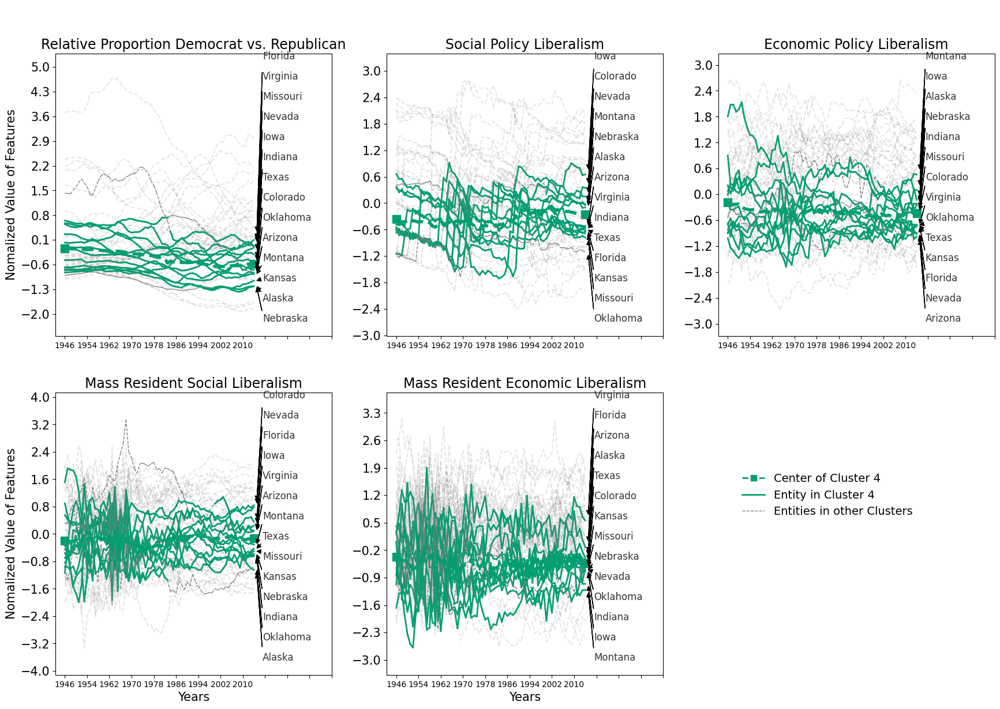

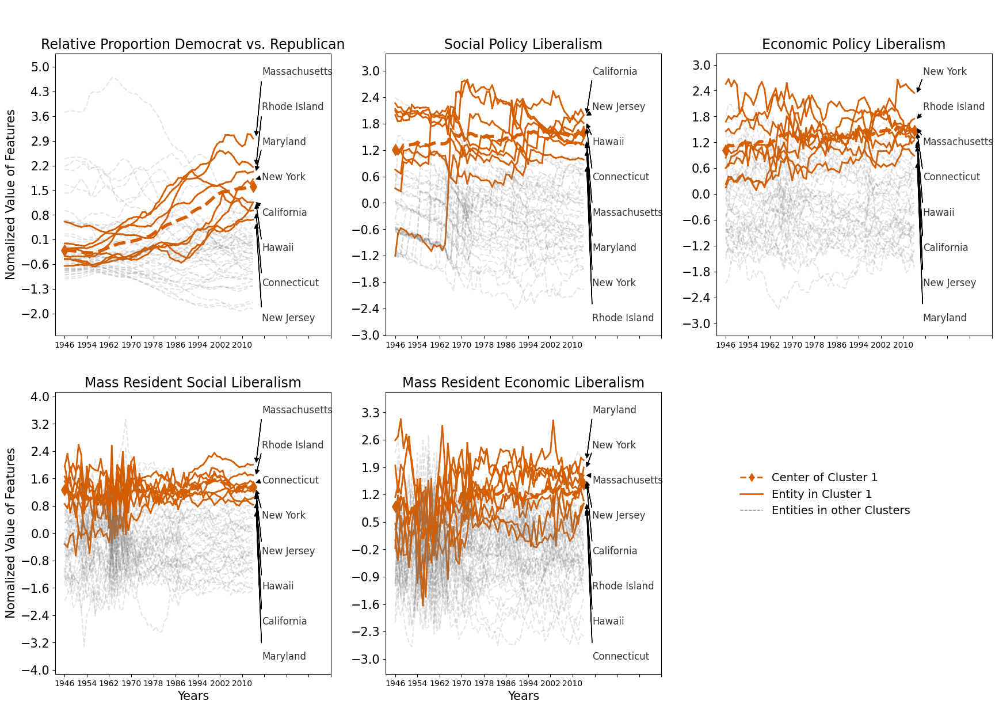

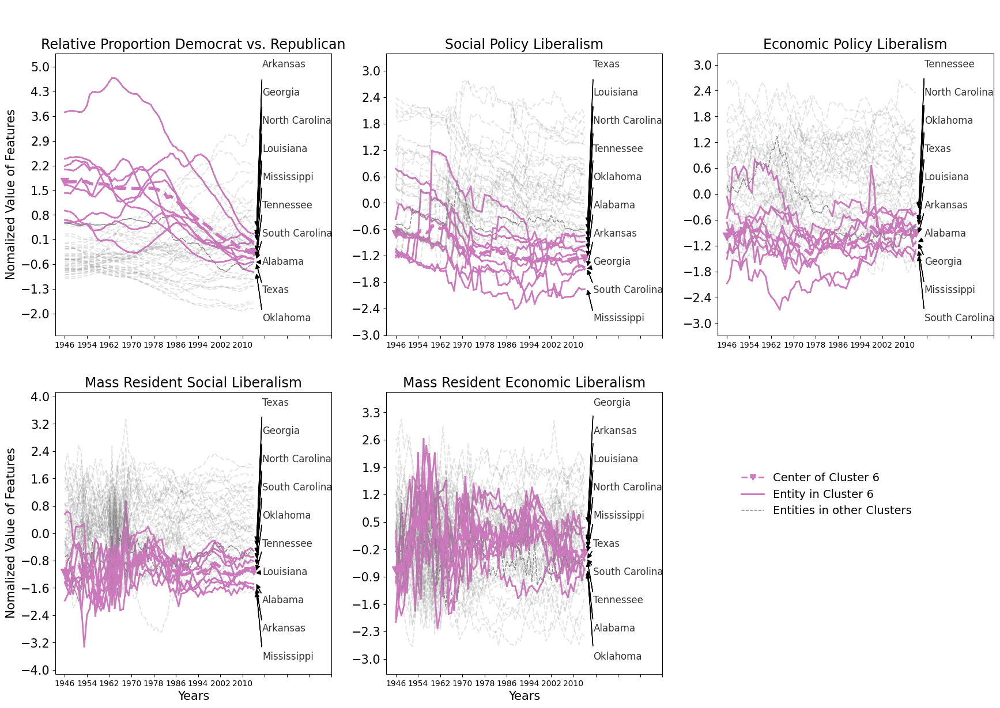

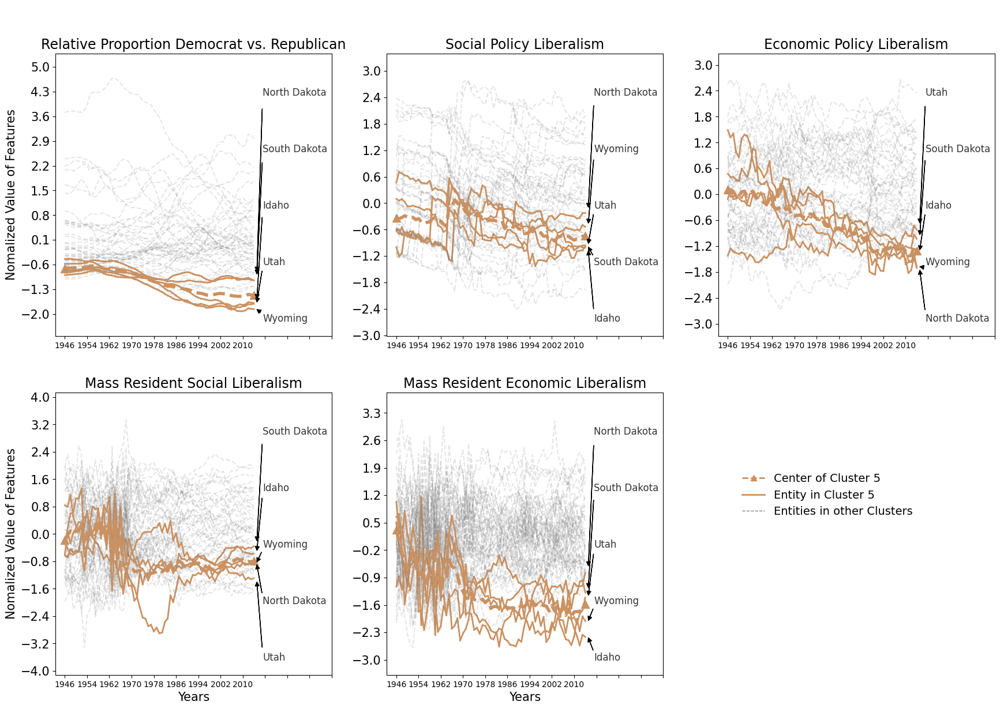

In [205]:
model_bdc.X_ = blue_red
cluster_name = ['cluster 2','cluster 3', 'cluster 4',
                'cluster 1','cluster 6','cluster 5']
for c in range(6):
    fig, axes = plots(model = copy.deepcopy(model_bdc), show_clusters=[c],                            
                            cluster_name = ['Cluster 2','Cluster 3', 'Cluster 4',
                                                'Cluster 1','Cluster 6','Cluster 5'],
                                color_palette = sns.color_palette('colorblind',6),
                                bbox_to_anchor=(1.25, 0.75), loc='upper left',show_annotations = True)
    #axes[0, 0].plot(range(len(data['year'].unique())), divided_line, lw = 5, ls = '-.', color = 'black')
    for i , ax in enumerate(axes):
        for j , a in enumerate(ax):
            if j == 0:
                a.set_ylabel('Nomalized Value of Features', fontsize=15)
            else:
                a.set_ylabel('')
            if i == 1:
                a.set_xlabel('Years', fontsize=15)
            else:
                a.set_xlabel('')
    axes[0,1].set_title('\n \nSocial Policy Liberalism', fontsize=17)
    axes[1,2].axis('off')
    plt.show()

The spatio distribtution of entities in each cluster

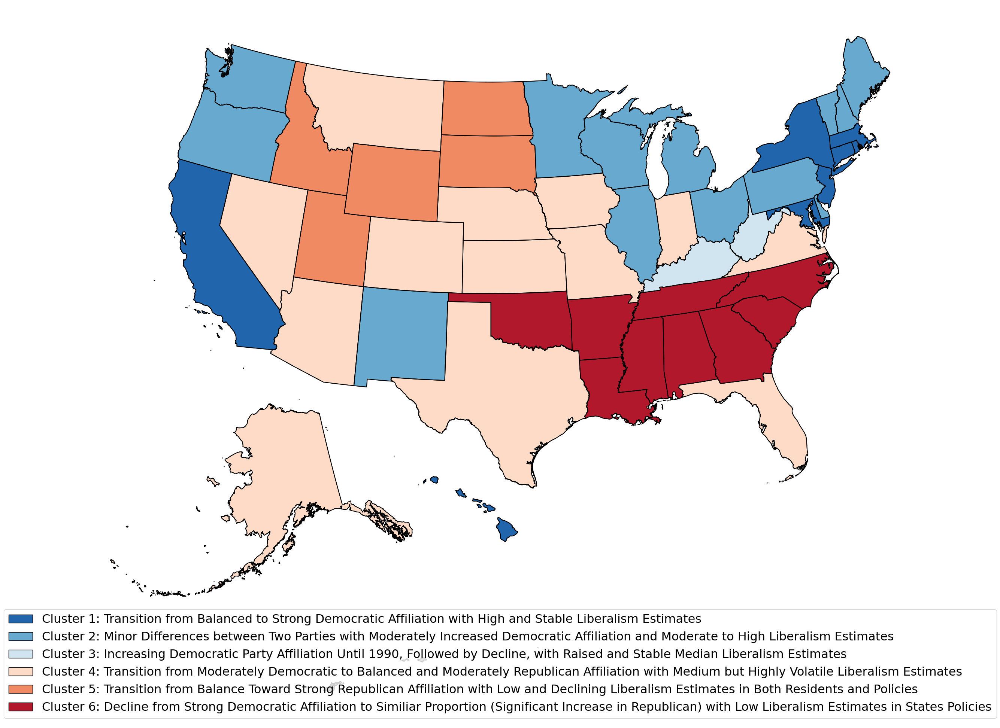

In [ ]:
us_state_map = gpd.read_file('us_state_spatial_map', crs = 'EPSG:4326')[['NAME', 'geometry']]
us_state_map = us_state_map[~us_state_map['NAME'].isin(['Puerto Rico','United States Virgin Islands',
                                                         'Commonwealth of the Northern Mariana Islands','Guam'])]
# obtain the cluster label for the last year
us_state_map['color'] = ['#2166ac' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,-1] == 3)]
                         else '#67a9cf' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,-1] ==0)]
                         else '#d1e5f0' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,-1] == 1)]
                         else '#fddbc7' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,-1] == 2)]
                         else '#ef8a62' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,-1] ==5)]
                         else '#b2182b' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,-1] ==4)]
                        else 'grey' for state in us_state_map['NAME']]
us_state_map.plot(color=us_state_map['color'] , legend=True, figsize=(30, 25), edgecolor = 'black')
us_state_map.boundary.plot(ax = plt.gca(), color = 'black')
legend_elements = [Patch(facecolor='#2166ac', edgecolor='black', label='Cluster 1: Transition from Balanced to Strong Democratic Affiliation with High and Stable Liberalism Estimates'),
                   Patch(facecolor='#67a9cf', edgecolor='black', label='Cluster 2: Minor Differences between Two Parties with Moderately Increased Democratic Affiliation and Moderate to High Liberalism Estimates'),
                   Patch(facecolor='#d1e5f0', edgecolor='black', label='Cluster 3: Increasing Democratic Party Affiliation Until 1990, Followed by Decline, with Raised and Stable Median Liberalism Estimates'),
                   Patch(facecolor='#fddbc7', edgecolor='black', label='Cluster 4: Transition from Moderately Democratic to Balanced and Moderately Republican Affiliation with Medium but Highly Volatile Liberalism Estimates'),
                   Patch(facecolor='#ef8a62', edgecolor='black', label='Cluster 5: Transition from Balance Toward Strong Republican Affiliation with Low and Declining Liberalism Estimates in Both Residents and Policies'),
                    Patch(facecolor='#b2182b', edgecolor='black', label='Cluster 6: Decline from Strong Democratic Affiliation to Similiar Proportion (Significant Increase in Republican) with Low Liberalism Estimates in States Policies')]
plt.axis('off')
plt.legend(handles=legend_elements, loc='lower center',fontsize = 23)
plt.show()

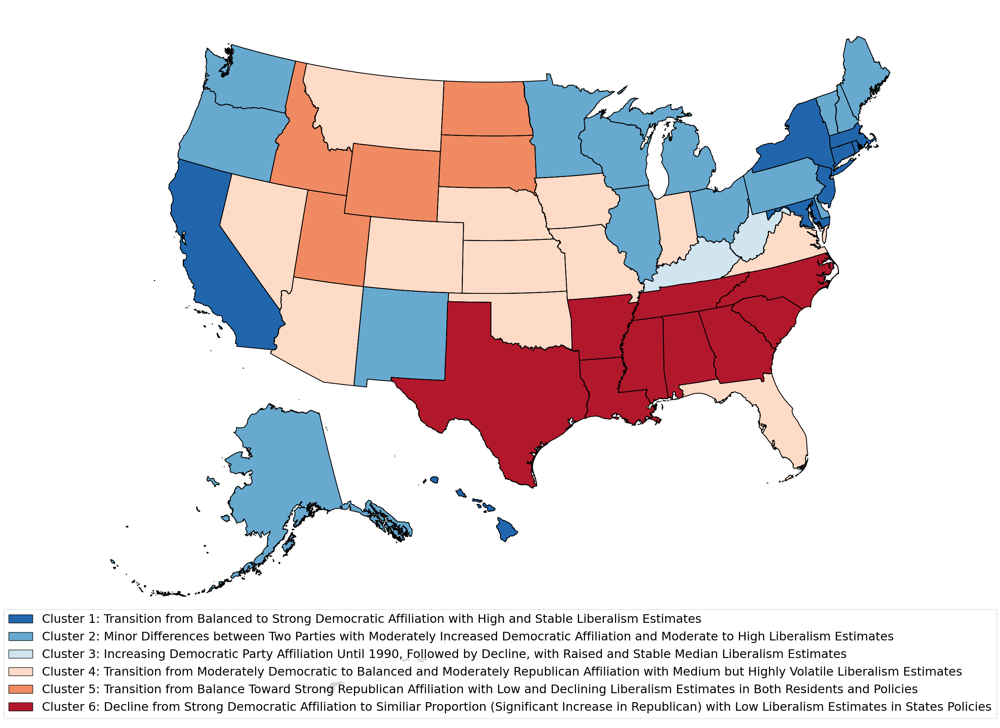

In [ ]:
# obtain the cluster label for the last year before any cluster changes happen
us_state_map['color'] = ['#2166ac' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,36] == 3)]
                         else '#67a9cf' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,36] ==0)]
                         else '#d1e5f0' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,36] == 1)]
                         else '#fddbc7' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,36] == 2)]
                         else '#ef8a62' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,36] ==5)]
                         else '#b2182b' if state in model_bdc.label_dict_['N'][np.where(model_bdc.labels_[:,36] ==4)]
                        else 'grey' for state in us_state_map['NAME']]
us_state_map.plot(color=us_state_map['color'] , legend=True, figsize=(30, 25), edgecolor = 'black')
us_state_map.boundary.plot(ax = plt.gca(), color = 'black')
plt.axis('off')
legend_elements = [Patch(facecolor='#2166ac', edgecolor='black', label='Cluster 1: Transition from Balanced to Strong Democratic Affiliation with High and Stable Liberalism Estimates'),
                   Patch(facecolor='#67a9cf', edgecolor='black', label='Cluster 2: Minor Differences between Two Parties with Moderately Increased Democratic Affiliation and Moderate to High Liberalism Estimates'),
                   Patch(facecolor='#d1e5f0', edgecolor='black', label='Cluster 3: Increasing Democratic Party Affiliation Until 1990, Followed by Decline, with Raised and Stable Median Liberalism Estimates'),
                   Patch(facecolor='#fddbc7', edgecolor='black', label='Cluster 4: Transition from Moderately Democratic to Balanced and Moderately Republican Affiliation with Medium but Highly Volatile Liberalism Estimates'),
                   Patch(facecolor='#ef8a62', edgecolor='black', label='Cluster 5: Transition from Balance Toward Strong Republican Affiliation with Low and Declining Liberalism Estimates in Both Residents and Policies'),
                    Patch(facecolor='#b2182b', edgecolor='black', label='Cluster 6: Decline from Strong Democratic Affiliation to Similiar Proportion (Significant Increase in Republican) with Low Liberalism Estimates in States Policies')]

plt.legend(handles=legend_elements, loc='lower center',fontsize = 23)
plt.show()

Analysis of cluster label changes (cf. Figure 6 of the manuscript)

In [ ]:
#idenitfy entities and their states names with the cluster label changes
[label_dict['N'][int(x.split('_')[0])] for x in model_bdc.changed_lst]

['Alaska', 'Oklahoma', 'Texas']

Label: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
Label: [2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4]
Label: [4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


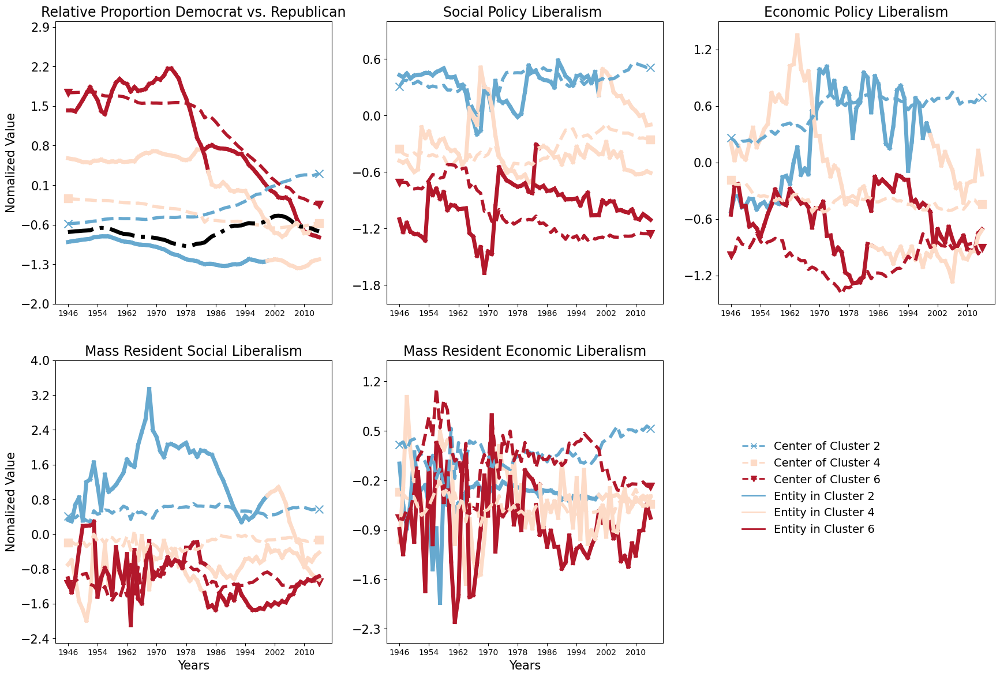

In [206]:
fig, axes = plots(model = copy.deepcopy(model_bdc), highlight_sample=['Alaska', 'Oklahoma', 'Texas']
                           , show_clusters=[0,2,4], 
                            hide_others=True, show_time_points=True, 
                            cluster_name = ['Cluster 2','Cluster 3', 'Cluster 4',
                                            'Cluster 1','Cluster 6','Cluster 5'],
                            color_palette = ['#67a9cf', '#d1e5f0', '#fddbc7', '#2166ac','#b2182b','#ef8a62'],
                            bbox_to_anchor=(1.25, 0.75), loc='upper left')

axes[0, 0].plot(range(len(data['year'].unique())), divided_line, lw = 5, ls = '-.', color = 'black')
axes[0, 0].set_ylim(-2,3)
axes[0,1].set_ylim(-2,1)
axes[0,2].set_ylim(-1.5,1.5)
axes[1,0].set_ylim(-2.5,4)
axes[1,1].set_ylim(-2.5,1.5)
for i , ax in enumerate(axes):
    for j , a in enumerate(ax):
        if j == 0:
            a.set_ylabel('Nomalized Value', fontsize=15)
        else:
            a.set_ylabel('')
        if i == 1:
            a.set_xlabel('Years', fontsize=15)
        else:
            a.set_xlabel('')
axes[1,2].axis('off')
plt.show()

## Case Study: Global Cultural Change: World Values Survey

### Data Loading

We aggregated the seven WVS waves from 1981 to 2022 into three time points to maximize the number of countries with complete data for the ten selected indicators (cf. Table 3 in Manuscript). The scores of the features were calculated as the mean of the survey responses per country, taking into account sampling weights and eliminating missing responses. Z-score normalization was applied to each feature to ensure all features are under the same scale. The resulting dataset covers 30 countries across three time points, with ten features capturing various aspects of cultural change.

In [5]:
data = pd.read_csv('data/world_value_survey_cleaned.csv')
culture_np = np.empty((len(data['year'].unique()), len(data['country'].unique()), len(data.columns[2:])))
for j, year in enumerate(data['year'].unique()):
    for i, country in enumerate(data['country'].unique()):
        culture_np[j, i] = data[(data['year'] == year) & (data['country'] == country)].values[0][2:]

culture_np.shape


(3, 30, 10)

In [6]:
data['country'].unique()

array(['ARG', 'ARM', 'AUS', 'BRA', 'CHL', 'CHN', 'COL', 'CYP', 'DEU',
       'JOR', 'JPN', 'KGZ', 'KOR', 'MEX', 'MYS', 'NGA', 'NLD', 'NZL',
       'PAK', 'PER', 'PHL', 'ROU', 'RUS', 'THA', 'TUR', 'TWN', 'UKR',
       'URY', 'USA', 'ZWE'], dtype=object)

In [175]:
data['year'].unique()

array([1995, 2012, 2020])

In [176]:
features = ['Happiness', 'Trust', 'Authority','Petition', ' God', 'Homosexuality','Abortion', 'Nationality', 'Post-Materialist', 'Autonomy']
label_dict = {'T': ['1995','2012','2020'], 'N': data['country'].unique(), 'F': features}

### Clustering Methods
Recall that SLA assumes that the cluster definitions remain constant over time, making it most suitable for datasets with few time points.\endnote{This assumption that the underlying cluster definitions do not change is also broadly consistent with the theoretical assumptions of Inglehart and colleagues. Moreover, when dealing with high-dimensional datasets containing many features, SLA can provide easily interpretable results. Moreover, as we show below, by using the bounded version of SLA, where we set the maximum number of allowed cluster label changes ($L$) greater than zero but less than the total number of possible changes, we can limit the number of times countries transition between clusters, helping us identify the most important and atypical transitions.  Given the relatively small size of the dataset, MILP optimization is feasible, ensuring that the solution is globally optimal and reproducible. In this example, we set the number of clusters ($K$) to 4 to maintain general consistency with the original work by Inglehart and colleagues.

Thus, we fitted two models:

- Model 1: SLA (`model_sla`) - static cluster definiton with unbounded number of label changes
- Model 2: Bounded SLA (`model_sla_bounded`) - static cluster definiton  with bounded number of label changes (3 changes allowed)

In [177]:
num_clusters = 4
# model 1: SLA - static cluster definiton with unbounded number of label changes
model_sla = OptTSCluster(
    n_clusters=num_clusters,
    scheme='z0c1', # fixed centers, dynamic assignment
    n_allow_assignment_change=None, # number of changes to allow, None means allow as many changes as possible
    random_state=42,
    warm_start=False)
model_sla = model_sla.fit(culture_np, label_dict = label_dict)

# model 2: Bounded SLA - static cluster definiton with bounded number of label changes (3 changes allowed)
model_sla_bounded = OptTSCluster(
    n_clusters=num_clusters,
    scheme='z0c1', # fixed centers, dynamic assignment
    n_allow_assignment_change=3 , # number of changes to allow, None means allow as many changes as possible
    random_state=42,
    warm_start=False)
model_sla_bounded = model_sla_bounded.fit(culture_np, label_dict = label_dict) 

Set parameter Username
Academic license - for non-commercial use only - expires 2026-01-12
Obj val: [6.84731294]

Total time is 26.9secs

Obj val: [6.92452969]

Total time is 283.51secs



### Cluster Centers

To begin our analysis, we applied the unbounded version of Sequence Label Analysis (SLA), where $L$ is set to allow all possible cluster label changes. Accordingly, all countries are allowed to move freely across clusters over time, while the cluster definitions remain constant. To help us interpret the cluster definitions, we created radar plots for each cluster that shows the relationships between the ten survey indicators and the center of each cluster. These definitions are based directly on the average survey responses rather than extracted principal components.

In [187]:
features = ['Happiness', 'Trust', 'Authority','Petition', ' God', 'Homosexuality','Abortion', 'Nationality', 'Post-Materialist', 'Autonomy','Happiness']
index = [0,1,2,3,4,5,6,7,8,9,0]
index = [4,9,6,7,2,8,0,5,3,1,4]
features = [features[i] + ': ' for i in index]

cluster_1 = pd.DataFrame(dict(
    r=model_sla.cluster_centers_[3,index],
    theta=features))
cluster_2 = pd.DataFrame(dict(
    r=model_sla.cluster_centers_[0, index],
    theta=features))
cluster_3 = pd.DataFrame(dict(
    r=model_sla.cluster_centers_[1,index],
    theta=features))
cluster_4 = pd.DataFrame(dict(
    r=model_sla.cluster_centers_[2,index],
    theta=features))

fig = make_subplots(rows=2, cols=2,specs=[[{'type': 'polar'}] * 2] * 2, horizontal_spacing= 0.15, vertical_spacing=0.2,
                    subplot_titles=( "Secular-rational <br>Self-expression<br> ", "Traditional <br>Self-expression<br> ",
                                     "Secular-rational <br>Survival<br> ","Traditional <br>Survival<br> "))
fig.add_trace(go.Scatterpolar(r=cluster_2['r'], theta=cluster_2['theta'] + cluster_2['r'].round(2).astype(str), fill='toself',
                               fillcolor='rgba(0,0,0,0.3)', line_color='black',name='Cluster 2'),row=2, col=2)
fig.add_trace(go.Scatterpolar(r=cluster_1['r'], theta=cluster_1['theta'] + cluster_1['r'].round(2).astype(str), fill='toself',
                              fillcolor='rgba(0,0,0,0.3)', line_color='black', name='Cluster 1'),row=1, col=2)
fig.add_trace(go.Scatterpolar(r=cluster_3['r'], theta=cluster_3['theta']+ cluster_3['r'].round(2).astype(str),fill='toself',
                               fillcolor='rgba(0,0,0,0.3)', line_color='black',  name='Cluster 3')  ,row=1, col=1)
fig.add_trace(go.Scatterpolar(r=cluster_4['r'], theta=cluster_4['theta']+ cluster_4['r'].round(2).astype(str),fill='toself',  
                               fillcolor='rgba(0,0,0,0.3)', line_color='black',name='Cluster 4')  ,row=2, col=1)

                

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[-2.5, 2],
      tickmode = 'array',
      tickvals = [-2.5, -2,-1, 0, 1,2,3],
      ticktext = [str(i) for i in [-2.5, -2,-1, 0, 1,2,3]]
    )),
    polar2=dict(
    radialaxis=dict(
      visible=True,
      range=[-2.5, 1.7],
            tickmode = 'array',
      tickvals = [-2.5, -2,-1, 0, 1, 1.5],
      ticktext = [str(i) for i in [-2.5, -2,-1, 0, 1, 1.5]]
    )),
    polar3=dict(
    radialaxis=dict(
      visible=True,
      range=[-2.5, 1.7],
            tickmode = 'array',
      tickvals = [-2.5, -2,-1, 0, 1, 2],
      ticktext = [str(i) for i in [-2.5, -2,-1, 0, 1, 1.5]]
    )),
    polar4=dict(
    radialaxis=dict(
      visible=True,
      range=[-2.5, 1.7],
            tickmode = 'array',
      tickvals = [-2.5, -2,-1, 0, 1, 1.5],
      ticktext = [str(i) for i in [-2.5, -2,-1, 0, 1, 1.5]]
    )),
  showlegend=False,
  width = 1200,
  height = 850,
  font  = dict(size=15)
)

cat = ['-2', '-1', '0', '1', '1.5']
tickvals = [-2, -1, 0, 1, 1.5],
fig.update_layout(polar={"radialaxis":{'angle':90,'tickangle':90,'ticks':'outside',
                                       'tickfont':{'size':15}}},
                  polar2={"radialaxis":{'angle':90,'tickangle':90,'ticks':'outside',
                                        'tickfont':{'size':15}}},
                  polar3={"radialaxis":{'angle':90,'tickangle':90,'ticks':'outside',
                                        'tickfont':{'size':15}}},
                  polar4={"radialaxis":{'angle':90,'tickangle':90,'ticks':'outside',
                                        'tickfont':{'size':15}}})

for i in fig['layout']['annotations']:
    i['font'] = dict(size=25,color='black')
fig.show()

Note that the cluster definitions in this case are robust to the $L$ we use. For example, for the bounded appoarch `model_sla_bounded`

In [ ]:
features = ['Happiness', 'Trust', 'Authority','Petition', ' God', 'Homosexuality','Abortion', 'Nationality', 'Post-Materialist', 'Autonomy','Happiness']
index = [0,1,2,3,4,5,6,7,8,9,0]
index = [4,9,6,7,2,8,0,5,3,1,4]
features = [features[i] + ': ' for i in index]

cluster_1 = pd.DataFrame(dict(
    r=model_sla_bounded.cluster_centers_[2,index],
    theta=features))
cluster_2 = pd.DataFrame(dict(
    r=model_sla_bounded.cluster_centers_[1, index],
    theta=features))
cluster_3 = pd.DataFrame(dict(
    r=model_sla_bounded.cluster_centers_[3,index],
    theta=features))
cluster_4 = pd.DataFrame(dict(
    r=model_sla_bounded.cluster_centers_[0,index],
    theta=features))

fig = make_subplots(rows=2, cols=2,specs=[[{'type': 'polar'}] * 2] * 2, horizontal_spacing= 0.15, vertical_spacing=0.2,
                    subplot_titles=( "Secular-rational <br>Self-expression<br> ", "Traditional <br>Self-expression<br> ",
                                     "Secular-rational <br>Survival<br> ","Traditional <br>Survival<br> "))
fig.add_trace(go.Scatterpolar(r=cluster_2['r'], theta=cluster_2['theta'] + cluster_2['r'].round(2).astype(str), fill='toself',
                               fillcolor='rgba(0,0,0,0.3)', line_color='black',name='Cluster 2'),row=2, col=2)
fig.add_trace(go.Scatterpolar(r=cluster_1['r'], theta=cluster_1['theta'] + cluster_1['r'].round(2).astype(str), fill='toself',
                              fillcolor='rgba(0,0,0,0.3)', line_color='black', name='Cluster 1'),row=1, col=2)
fig.add_trace(go.Scatterpolar(r=cluster_3['r'], theta=cluster_3['theta']+ cluster_3['r'].round(2).astype(str),fill='toself',
                               fillcolor='rgba(0,0,0,0.3)', line_color='black',  name='Cluster 3')  ,row=1, col=1)
fig.add_trace(go.Scatterpolar(r=cluster_4['r'], theta=cluster_4['theta']+ cluster_4['r'].round(2).astype(str),fill='toself',  
                               fillcolor='rgba(0,0,0,0.3)', line_color='black',name='Cluster 4')  ,row=2, col=1)

                

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[-2.5, 2],
      tickmode = 'array',
      tickvals = [-2.5, -2,-1, 0, 1,2,3],
      ticktext = [str(i) for i in [-2.5, -2,-1, 0, 1,2,3]]
    )),
    polar2=dict(
    radialaxis=dict(
      visible=True,
      range=[-2.5, 1.7],
            tickmode = 'array',
      tickvals = [-2.5, -2,-1, 0, 1, 1.5],
      ticktext = [str(i) for i in [-2.5, -2,-1, 0, 1, 1.5]]
    )),
    polar3=dict(
    radialaxis=dict(
      visible=True,
      range=[-2.5, 1.7],
            tickmode = 'array',
      tickvals = [-2.5, -2,-1, 0, 1, 2],
      ticktext = [str(i) for i in [-2.5, -2,-1, 0, 1, 1.5]]
    )),
    polar4=dict(
    radialaxis=dict(
      visible=True,
      range=[-2.5, 1.7],
            tickmode = 'array',
      tickvals = [-2.5, -2,-1, 0, 1, 1.5],
      ticktext = [str(i) for i in [-2.5, -2,-1, 0, 1, 1.5]]
    )),
  showlegend=False,
  width = 1200,
  height = 850,
  font  = dict(size=15)
)

cat = ['-2', '-1', '0', '1', '1.5']
tickvals = [-2, -1, 0, 1, 1.5],
fig.update_layout(polar={"radialaxis":{'angle':90,'tickangle':90,'ticks':'outside',
                                       'tickfont':{'size':15}}},
                  polar2={"radialaxis":{'angle':90,'tickangle':90,'ticks':'outside',
                                        'tickfont':{'size':15}}},
                  polar3={"radialaxis":{'angle':90,'tickangle':90,'ticks':'outside',
                                        'tickfont':{'size':15}}},
                  polar4={"radialaxis":{'angle':90,'tickangle':90,'ticks':'outside',
                                        'tickfont':{'size':15}}})

for i in fig['layout']['annotations']:
    i['font'] = dict(size=25,color='black')
#save the figure
fig.show()

python(21019) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


we can show the position of each country at each of the three aggregated time points by projecting the feature space into 2-D, along with the centers of the four clusters. Cluster labels for each time point are represented by different colors, with the center of each cluster indicated by crosses. The colored regions are formed by connecting four archetypal points

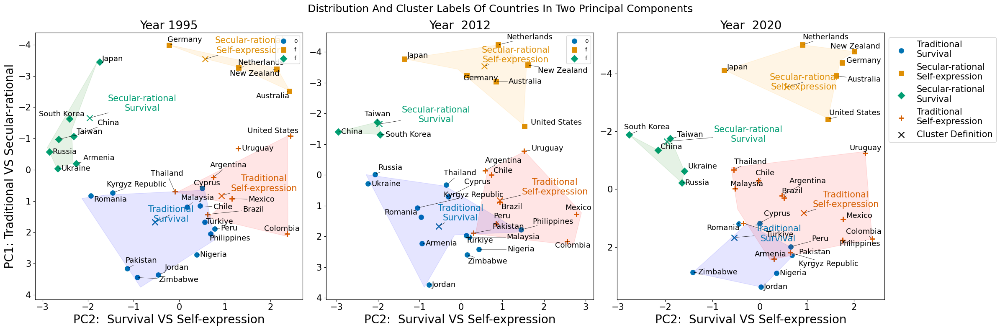

In [ ]:
plt.figure(figsize=(24,8))
np.random.seed(42)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(np.concatenate([culture_np[0], culture_np[1], culture_np[2], model_sla.cluster_centers_]))
pca_result = np.array([pca_result[:,1], pca_result[:,0]]).T
markers = ['o', 's', 'D', 'P']
cluster_name = ['Traditional\nSurvival', 'Secular-rational\nSelf-expression', 'Secular-rational\nSurvival','Traditional\nSelf-expression']
for axs in range(1,4):
    plt.subplot(1,3,axs)
    for c in range(4):
        cluster_indices = np.where(model_sla.labels_[:,axs-1] == c)[0]
        x = pca_result[(axs-1)*30:axs*30,0]
        y = pca_result[(axs-1)*30:axs*30,1]
        sns.scatterplot(x=x[cluster_indices], y=y[cluster_indices], 
        color = sns.color_palette('colorblind')[c], s=100, marker  = markers[c], label = cluster_name[c])
    texts = []
    for i, txt in enumerate(label_dict['N']):
        txt = coco.convert(names=txt, to='name_short')
        texts.append(plt.text(pca_result[(axs-1)*30+i,0], pca_result[(axs-1)*30+i,1], txt, fontsize=13))
    if axs == 1:
        plt.ylabel('PC1: Traditional VS Secular-rational', fontsize=20)
    plt.xlabel('PC2:  Survival VS Self-expression', fontsize=20)
    plt.title(('year ' + ['1995', ' 2012', ' 2020'][axs-1]).title(), fontsize=20)
    plt.xticks(range(-3,[6,7,8][axs-1]))
    plt.scatter(pca_result[90,0], pca_result[90,1], s=100, c='black', marker='x', label='Cluster Definition')
    if axs == 3:
        #add marker x to legend
        plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, fontsize=15)
    else:
        plt.legend('off')

    for c in range(4):
        plt.scatter(pca_result[90+c,0], pca_result[90+c,1], s=100, c=sns.color_palette('colorblind')[c], label=cluster_name[c], marker='x')
        texts.append(plt.text(pca_result[90+c,0], pca_result[90+c,1], cluster_name[c], color = sns.color_palette('colorblind')[c], fontsize=15))
        points = np.concatenate([pca_result[(axs-1)*30:axs*30][np.where(model_sla.labels_[:,axs-1] == c)], pca_result[90+c].reshape(1,2)])
        hull = ConvexHull(points)
        x,y = [],[]
        convex = hull.points[hull.vertices]
        for point in convex:
            x.append(point[0])
            y.append(point[1])
        x.append(convex[0][0])
        y.append(convex[0][1])

        x,y = np.array(x),np.array(y)

        points = points.T
        count = 0
        while true:
            try:
                XC, S, C, SSE, varexpl = PCHA(points, noc=5, delta=0.1)
                break
            except:
                count += 1
                if count > 10:
                    count = 0
                    while true:
                        try:
                            XC, S, C, SSE, varexpl = PCHA(points, noc=4, delta=0.1)
                            break
                        except:
                            count += 1
                            if count > 10:
                                raise ValueError('Cannot find a convex hull')
                            else:
                                continue
                    break
                else:
                    continue
        x = np.array(XC[0].tolist()[0])
        y = np.array(XC[1].tolist()[0])
        order = np.argsort(np.arctan2(y - y.mean(), x - x.mean()))
        plt.fill(x[order], y[order], alpha=0.1, color=['blue','orange','green','red'][c])
    # switch x-axis and y-axis
    plt.gca().invert_yaxis()

    adjust_text(texts, arrowprops=dict(arrowstyle="->", lw=0.5))

plt.gcf().suptitle('Distribution and cluster labels of countries in two principal components'.title(), fontsize=18)
plt.tight_layout()
plt.show()

### Cluster Label Changes in SLA

we can also identify countries with cluster label changes using SLA with all possible changes

In [189]:
year_1995 = pd.DataFrame([[label_dict['N'][np.where(model_sla.labels_[:,0] == i)][j] 
                           if j < label_dict['N'][np.where(model_sla.labels_[:,0] == i)].shape[0] 
                           else ' ' for j in range(21)] for i in range(3)], 
                           index=['cluster 1_1995', 'cluster 2_1995', 'cluster 3_1995']).T.fillna('')

year_2012 = pd.DataFrame([[label_dict['N'][np.where(model_sla.labels_[:,1] == i)][j] 
                           if j < label_dict['N'][np.where(model_sla.labels_[:,1] == i)].shape[0] 
                           else ' ' for j in range(21)] for i in range(3)],
                        index=['cluster 1_2012', 'cluster 2_2012', 'cluster 3_2012']).T.fillna('')

year_2020 = pd.DataFrame([label_dict['N'][np.where(model_sla.labels_[:,2] == i)] for i in range(3)], 
                         index=['cluster 1_2020', 'cluster 2_2020', 'cluster 3_2020']).T.fillna('')

label_change = pd.merge(pd.merge(year_1995, year_2012, left_index=True, right_index=True), year_2020, left_index=True, right_index=True)
label_change

,cluster 1_1995,cluster 2_1995,cluster 3_1995,cluster 1_2012,cluster 2_2012,cluster 3_2012,cluster 1_2020,cluster 2_2020,cluster 3_2020
0,CHL,AUS,ARM,ARM,AUS,CHN,CYP,AUS,CHN
1,CYP,DEU,CHN,CYP,DEU,KOR,JOR,DEU,KOR
2,JOR,NLD,JPN,JOR,JPN,TWN,NGA,JPN,RUS
3,KGZ,NZL,KOR,KGZ,NLD,,PAK,NLD,TWN
4,MYS,,RUS,MYS,NZL,,PER,NZL,UKR
5,NGA,,TWN,NGA,USA,,ROU,USA,
6,PAK,,UKR,PHL,,,ZWE,,


### Identifying Notable Movements Between Clusters

To identify some of the key atypical cluster label changes across clusters, we set the maximum number of allowed cluster label changes to $L=3$ (`model_sla_bounded`). This retains the cluster definitions we outlined earlier, but also the top three atypical cluster label changes, prioritizing those that most significantly reduce the clustering objective. It is important to underscore that these countries were selected based on the SLA method, and not in ad hoc way.  

In [190]:
for i, label in enumerate(model_sla_bounded.labels_):
    if len(list(set(label))) > 1:
        print(model_sla_bounded.label_dict_['N'][i], label)


ARM [0 2 2]
JPN [0 3 3]
USA [2 3 3]


Label: [2 3 3]


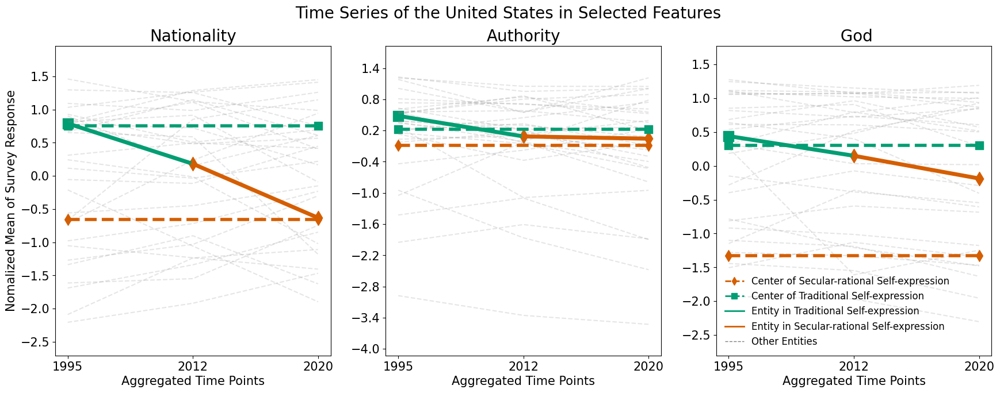

In [191]:
fig, axes = plots(copy.deepcopy(model_sla_bounded),
                highlight_sample=['USA'], 
              select_features = [7,2,4],
              show_clusters = [2,3],
              cluster_name = ["Secular-rational Survival", 
              "Traditional Survival","Traditional Self-expression",
              "Secular-rational Self-expression"],
                                     show_time_point = True)

for ax in axes:
    for a in ax:
        a.set_xlabel('Aggregated Time Points', fontsize=15)
axes[0,0].set_ylabel('Nomalized Mean of Survey Response', fontsize=15)
fig.suptitle('Time Series of the United States in Selected Features', fontsize=20)
plt.show()

Label: [0 2 2]


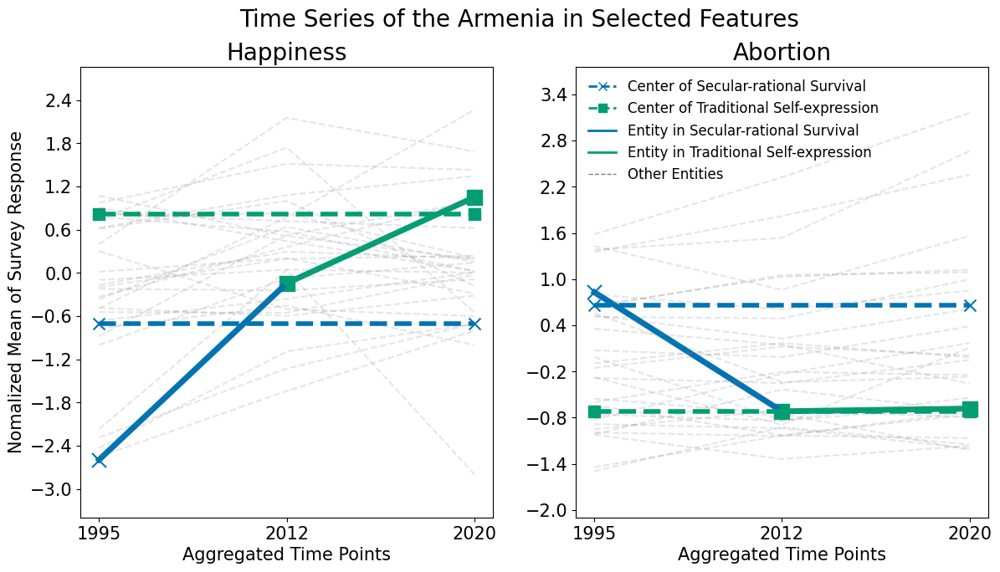

In [193]:
import select
from tkinter import font
fig, axes = plots(copy.deepcopy(model_sla_bounded),
                highlight_sample=['ARM'], 
              select_features = [0,6],
              show_clusters = [0, 2],
              cluster_name = ["Secular-rational Survival", 
              "Traditional Survival","Traditional Self-expression",
              "Secular-rational Self-expression"],
              show_time_point = True)

for ax in axes:
    for a in ax:
        a.set_xlabel('Aggregated Time Points', fontsize=15)
axes[0,0].set_ylabel('Nomalized Mean of Survey Response', fontsize=15)
fig.suptitle('Time Series of the Armenia in Selected Features', fontsize=20)
plt.show()

Label: [0 3 3]


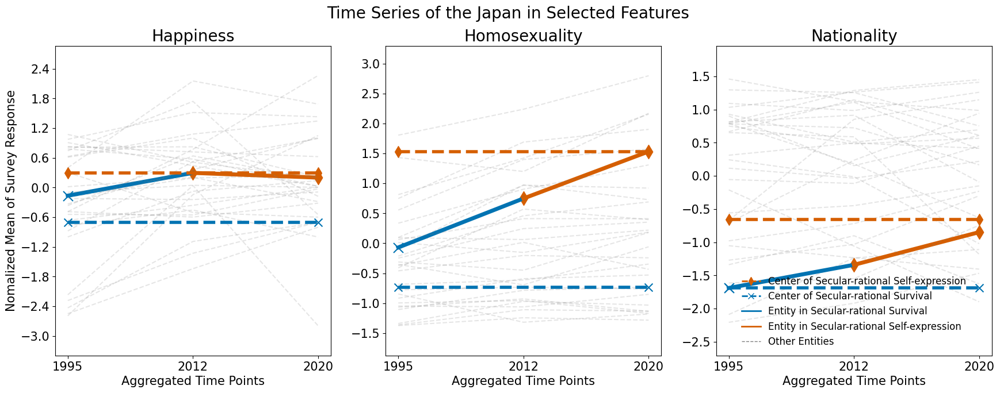

In [194]:
fig, axes = plots(copy.deepcopy(model_sla_bounded),highlight_sample=['JPN'], 
              select_features = [0,5,7],
              show_clusters = [0,3],
              cluster_name = ["Secular-rational Survival", 
              "Traditional Survival","Traditional Self-expression",
              "Secular-rational Self-expression"],
              show_time_point = True)

for ax in axes:
    for a in ax:
        a.set_xlabel('Aggregated Time Points', fontsize=15)
axes[0,0].set_ylabel('Nomalized Mean of Survey Response', fontsize=15)
fig.suptitle('Time Series of the Japan in Selected Features', fontsize=20)
plt.show()

## Case Study: Business Development Patterns in Chicago

### Data Loading

The temporal data for this study was sourced from the ZIP Codes Business Patterns (ZBP), covering annual statistics from 2007 to 2016 on the number of establishments across various business sectors. These sectors are categorized according to the North American Industry Classification System (NAICS). These data have been featured in sociological research on the organizational resources in poor urban neighborhoods and the cultural profile of U.S. neighborhoods, among others.

 Our analysis focuses on six specific types of business sectors. This selection was made to balance computational feasibility with the diversity of business types analyzed. Out of the 61 ZIPs in Chicago, the study included data from 50 ZIPs. The selection criteria were based on the number of establishments in the six identified business types exceeding a predefined threshold. 
 
 This approach ensures the elimination of ZIPs with near-zero values, which could potentially skew the analysis and results. The final temporal dataset for this case study contains 50 entities with six features across 10 time points.

In [ ]:
data = np.load('data/data_chicago_business_development_cleaned.npy')

zip_code = [60088,60185,60411,60415,60607,60608,60609,60610,60611,
        60612,60613,60614,60615,60616,60617,60618,60619,60620,60621,
        60622,60623,60625,60626,60628,60629,60630,60631,60632,60633,
        60634,60636,60637,60638,60639,60640,60641,60643,60644,60645,60646,60647,
        60649,60651,60652,60653,60654,60655,60656,60657,60660]

features = ['Full-service restaurants','Supermarkets and other grocery (except convenience) stores',
        'Religious organizations','Child day care services','Hotels (except casino hotels) and motels',
        'Beer, wine, and liquor stores']

years = [2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016]

### Clustering Method 1:  Sequence Label Analysis



We first applied the existing approach, which corresponds to SLA without limiting cluster label changes in our framework, under the same setting (i.e., $K=3$) for comparative purposes. The first stage disregards the temporal dimension by treating each time point as an individual entity in *K*-means or other standard clustering methods, equivalent to SLA in the proposed framework. 

In [85]:
np.random.seed(24)
# Applying Kmeans on each time point
model_sla = TSGlobalKmeans(n_clusters=3, max_iter=100, verbose=1)
model_sla = model_sla.fit(data)
df_cluster_label_sla = pd.DataFrame(model_sla.labels_,index=zip_code, 
columns=['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016'])

Initialization complete
Iteration 0, inertia 434900.0.
Iteration 1, inertia 345052.01498806477.
Iteration 2, inertia 327804.8577707717.
Iteration 3, inertia 311944.5790352642.
Iteration 4, inertia 305565.9301178522.
Iteration 5, inertia 302799.9616323764.
Iteration 6, inertia 301492.38321303634.
Iteration 7, inertia 300474.46389857796.
Iteration 8, inertia 298523.77502219705.
Iteration 9, inertia 296162.6670836973.
Iteration 10, inertia 295052.41715716885.
Iteration 11, inertia 293642.1938236669.
Iteration 12, inertia 292505.0984243701.
Iteration 13, inertia 292059.8876470382.
Iteration 14, inertia 291966.95777261205.
Iteration 15, inertia 291933.8377673821.
Iteration 16, inertia 291891.2093656453.
Converged at iteration 16: center shift 0.02709446118647823 within tolerance 0.03197117706666665.


We next examining the neighborhoods with label changes in SLA. We sorted the neighborhood by the total number of changes across all time point to identify the neighborhoods with the most atipyical changes:

In [86]:

# count the number of changes in the cluster label
n_change_sla = df_cluster_label_sla.copy()
def num_change(row):
    prev = row[0]
    count = 0
    for i in row:
        if i != prev:
            count += 1
        prev = i
    return int(count)

for ind, row in n_change_sla.iterrows():
    n_change_sla.loc[ind, 'num_change'] = num_change(row)

n_change_sla['num_change'] = n_change_sla['num_change'].astype(int)

n_change_sla = n_change_sla.sort_values(by='num_change', ascending=False)
n_change_sla.head(10)  

,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,num_change
60643,1,1,1,1,2,1,2,1,1,1,4
60618,2,0,2,0,0,0,0,0,0,0,3
60411,2,2,2,2,2,2,2,1,1,2,2
60637,1,1,2,2,2,2,2,1,1,1,2
60654,1,1,1,1,1,0,0,0,0,0,1
60625,2,2,2,0,0,0,0,0,0,0,1
60613,2,2,2,2,2,2,0,0,0,0,1
60641,1,1,1,1,1,2,2,2,2,2,1
60088,1,1,1,1,1,1,1,1,1,1,0
60634,2,2,2,2,2,2,2,2,2,2,0


And the cluster definition based on the mean value of samples in each cluster

(array([0.5, 1.5, 2.5]),
 [Text(0.5, 0, 'Hotels and Restaurants'),
  Text(1.5, 0, 'Low Business Establishment'),
  Text(2.5, 0, 'Daily Needs')])

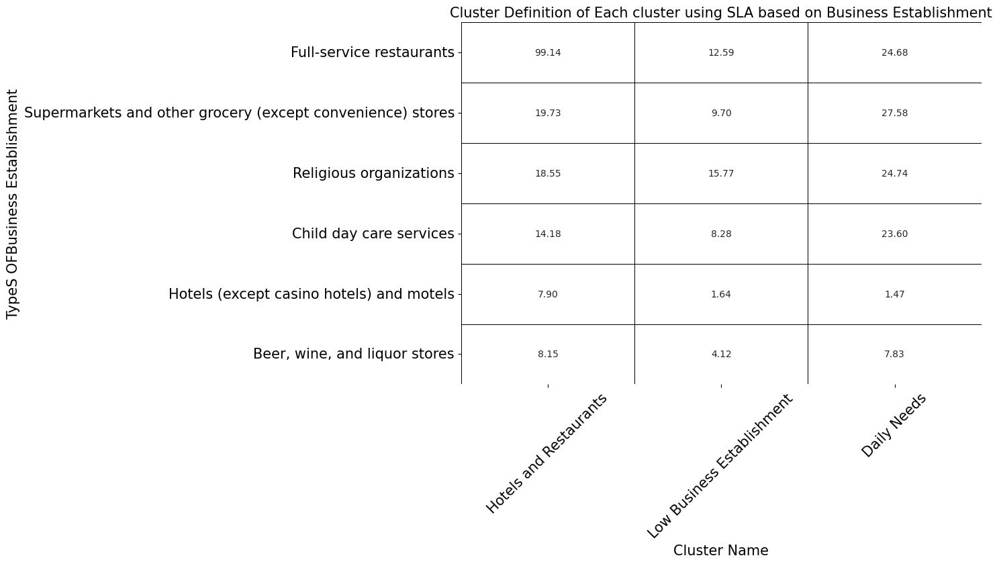

In [87]:
result = [[[],[],[],[],[],[]] for i in range(3)]
for i, row in n_change_sla.iterrows():
    current = data[:,zip_code.index(i),:]
    label  = row[:-1]
    for j in range(10):
        for k in range(6):
            result[label[j]][k].append(current[j,k])   
matrix = np.zeros((3,6))
for cluster in result:
    for feature in cluster:
        matrix[result.index(cluster), cluster.index(feature)] = np.mean(feature)
result = pd.DataFrame(model_sla.cluster_centers_.T.copy())

from matplotlib.colors import ListedColormap
result.index = features
result.columns = ['Hotels and Restaurants','Low Business Establishment','Daily Needs']
plt.figure(figsize=(10, 7))
sns.heatmap(result, annot=True, cmap=ListedColormap(['white']), fmt=".2f", linewidths=0.5, linecolor='black',cbar=False)
plt.title('Cluster Definition of Each cluster using SLA based on Business Establishment', fontsize=15)
plt.xlabel('Cluster Name', fontsize=15)
plt.ylabel('TypeS OFBusiness Establishment', fontsize=15)
plt.xticks(fontsize=15, rotation=45)

Integrating with the spatial distribution of neighborhoods in each cluster

In [ ]:
# loading the geographical visualization of Chicago
chicago = gpd.read_file('chicago_spatial_map.geojson')
cluster_name = ['\'Hotels and Restaurants\'','\'Low Business Activity\'','\'Daily Needs\'']

We provided a helper function in `helper.py` to visualize following sptial distribution of ZIP code by their cluster assignment

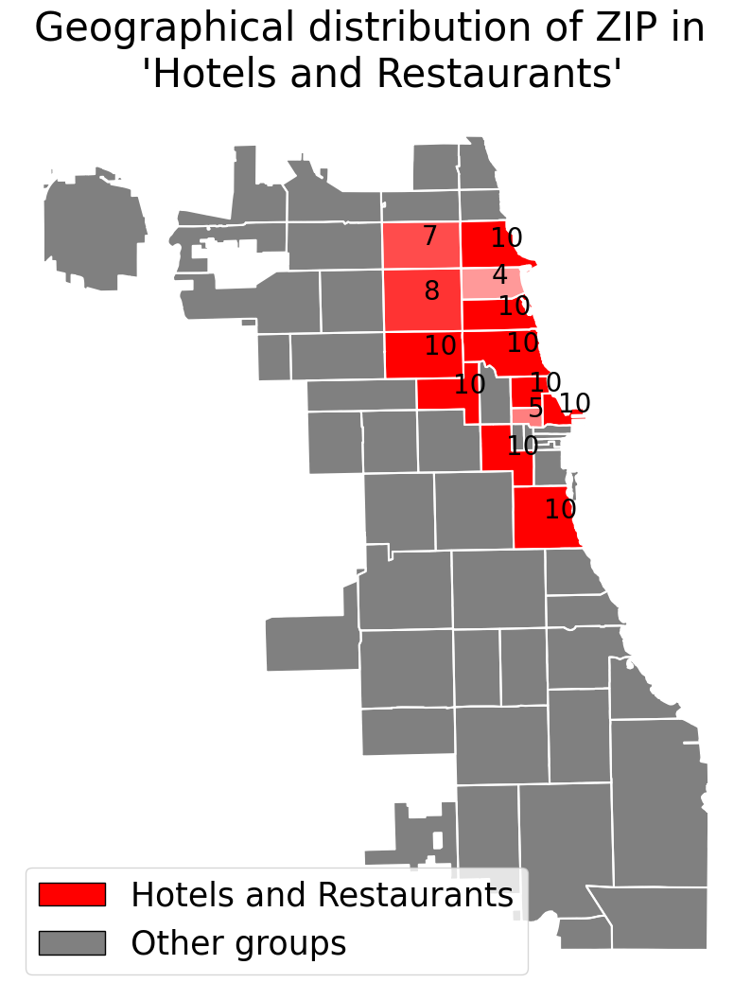

In [ ]:
hp.plot_sptial_distribution(chicago, 0, n_change_sla, cluster_name)
plt.show()

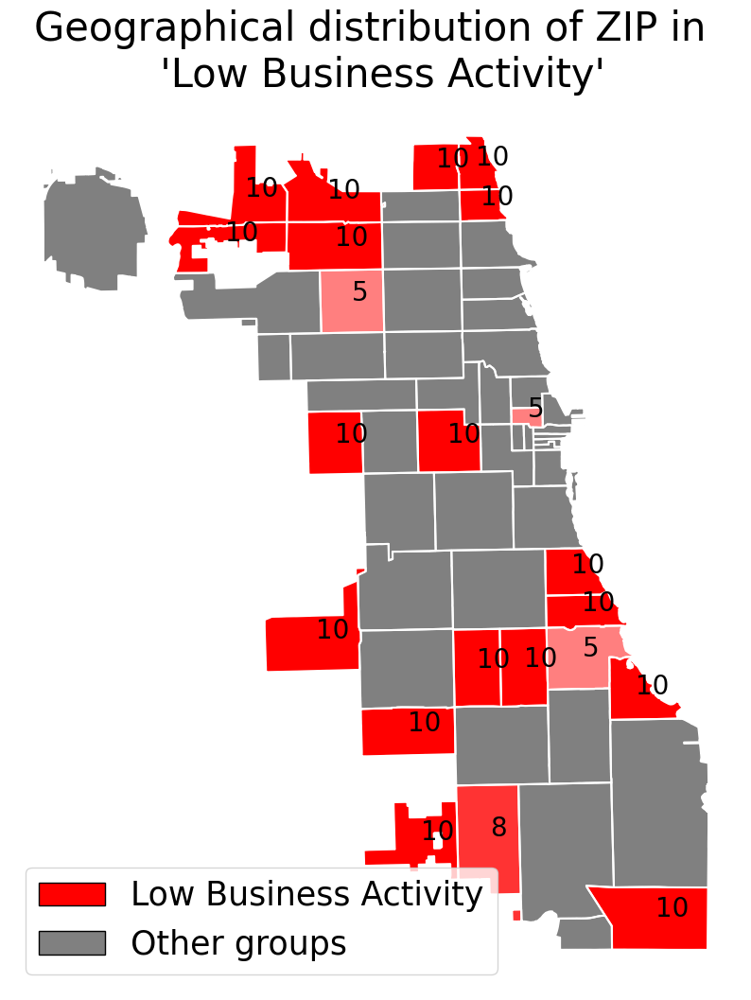

In [ ]:
hp.plot_sptial_distribution(chicago, 1, n_change_sla, cluster_name)
plt.show()

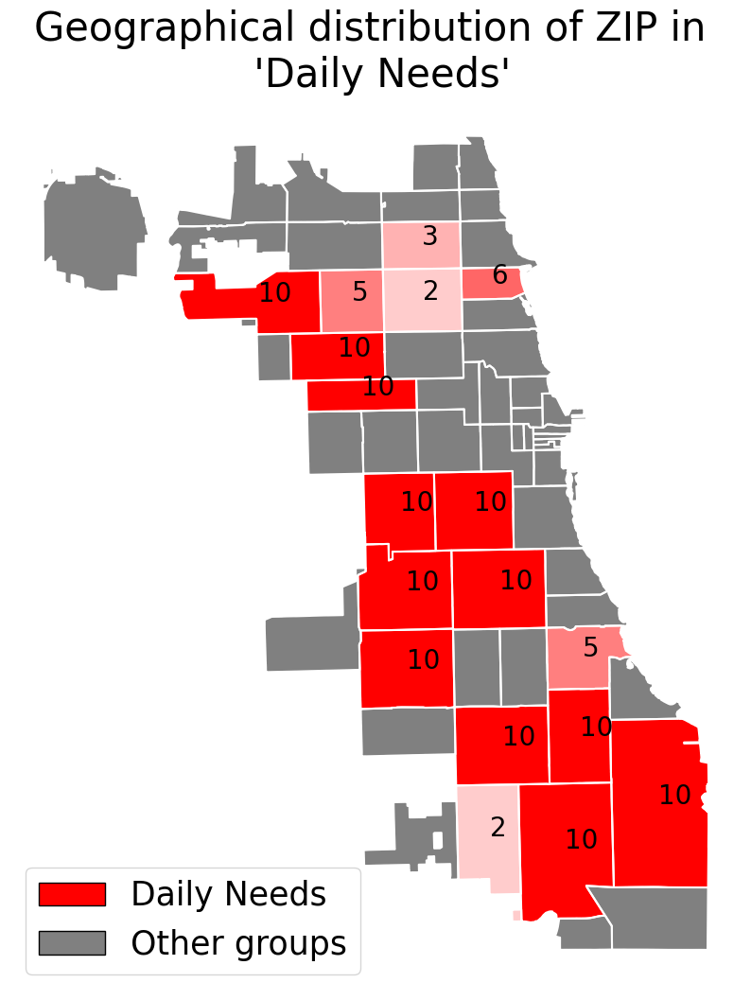

In [ ]:
hp.plot_sptial_distribution(chicago, 2, n_change_sla, cluster_name)
plt.show()

### Clustering Method 2: Dynamic Clustering ($L = 1$)


We propose that Dynamic Clustering (DC) would be more suitable for neighborhood change studies. With DC, cluster definitions can be directly interpreted as temporal trends rather than static values, eliminating the need for a second-stage sequence analysis to summarize the temporal relationships using the OM distance, as has been done in previous studies. This reduces external factors that can introduce biases and eliminates possible information loss. As illustrated in prior case studies, adjusting the number of maximum cluster label changes, $L = 1$, allows us to autonomously identify atypical trends within temporal data, which are also novel compared to previous studies. 

In [ ]:
model_dc_bounded = OptTSCluster(
    n_clusters=num_clusters,
    scheme='z1c1', # fixed centers, dynamic assignment
    n_allow_assignment_change=1 , # number of changes to allow, None means allow as many changes as possible
    random_state=42,
    warm_start=False)
    
model_dc_bounded = model_dc_bounded.fit(data)
cluster_center_dc = model_dc_bounded.cluster_centers_
cluster_label_dc = model_dc_bounded.labels_

Due to the runing time, we have provided a pre-run cluster center and cluster label using above clustering methods

In [8]:
cluster_center_dc = np.load('pre-run results/cluster_center_chicago_business_development.npy', allow_pickle=True)
cluster_label_dc = np.load('pre-run results/cluster_label_chicago_business_development.npy', allow_pickle=True)
df_cluster_label_dc = pd.DataFrame(cluster_label_dc,index=zip_code, 
columns=['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016'])

Different from SLA, the cluster center has an additional temporal dimension, which consist a 3D array with $K \times F \times T$

In [95]:
cluster_center_dc.shape

(3, 6, 10)

We can visualize them as a 3D waterfall plot, we provided a helper function for this task

In [143]:

final_year_label = df_cluster_label_dc.reset_index().iloc[:,-1]

data_reshaped = []
for zip in range(data.shape[1]):
    current_zip = []
    for feature in range(data.shape[2]):
        current_feature = []
        for year in range(data.shape[0]):
            current_feature.append(data[year,zip,feature])
        current_zip.append(current_feature)
    data_reshaped.append(current_zip)

mean_samples = []
for i in range(len(features)):
    #create a dictionary to store the average of each cluster
    average = [[[] for t in range(10)] for i in range(len(final_year_label.unique()))]
    #iterate through each sample
    for j in range(len(data_reshaped)):
        for t in range(10):
            average[final_year_label.tolist()[j]][t].append(data_reshaped[j][i][t])

    average_mean = np.zeros((3,10))
    for i in range(len(average)):
        for j in range(len(average[0])):
            average_mean[i,j] = np.mean(average[i][j])
    mean_samples.append(average_mean)
mean_samples = np.array(mean_samples)
mean_samples_reshaped = np.zeros((3,6,10))
for c in range(3):
    for j in range(6):
        for t in range(10):
            mean_samples_reshaped[c,j,t] = mean_samples[j][c][t]
# min max normalize the cluster center for better visualization
for j in range(6):
    mean_samples_reshaped[:,j,:] = (mean_samples_reshaped[:,j,:]-np.min(mean_samples_reshaped[:,j,:]))/(np.max(mean_samples_reshaped[:,j,:])-np.min(mean_samples_reshaped[:,j,:]))

<Figure size 1000x2000 with 0 Axes>

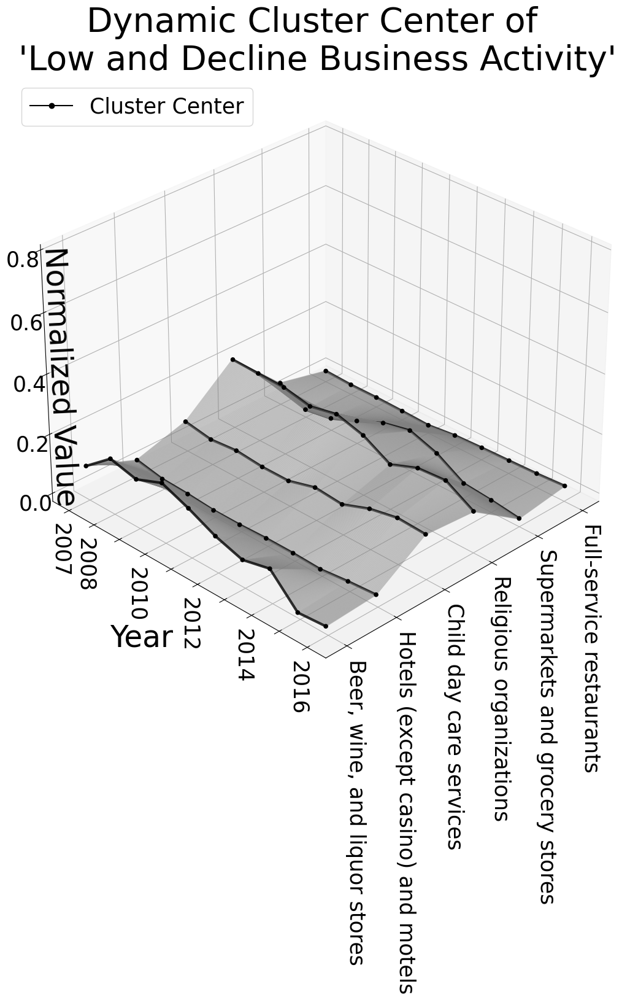

In [161]:
# average = np.load('average_chicago_business_development.npy', allow_pickle=True)
plt.figure(figsize = (10,20))
hp.waterfall_plot_center(data_array = mean_samples_reshaped, sample = '1', 
cluster_label = df_cluster_label_dc.iloc[45,:])
plt.savefig('Figure13a_waterfall_plot_center_1.pdf', bbox_inches='tight')

<Figure size 1000x2000 with 0 Axes>

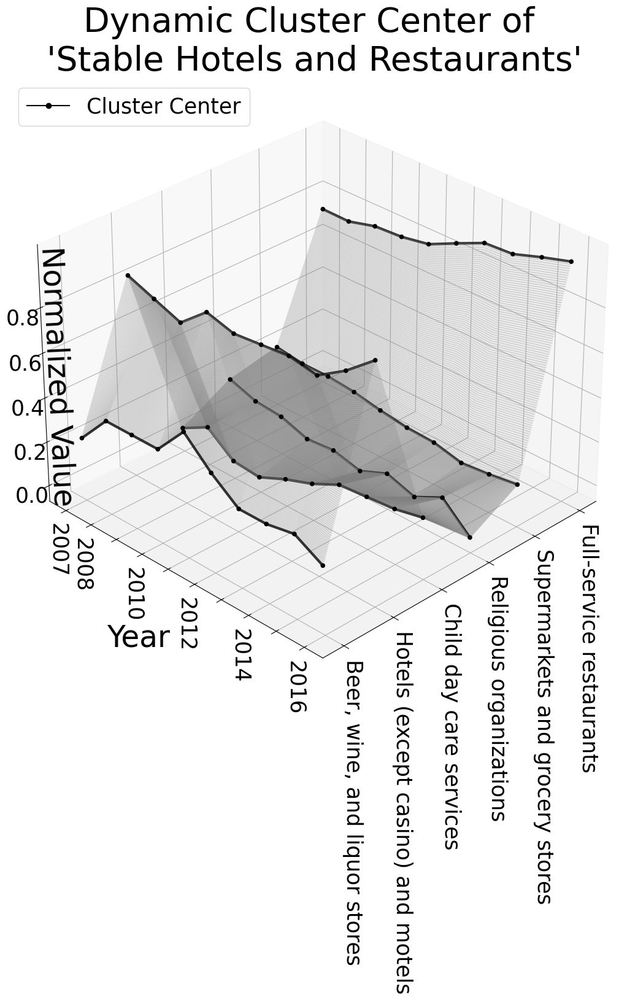

In [ ]:
plt.figure(figsize = (10,20))
hp.waterfall_plot_center(data_array = mean_samples_reshaped, sample = '2', 
cluster_label = df_cluster_label_dc.iloc[45,:])
plt.show()

<Figure size 1000x2000 with 0 Axes>

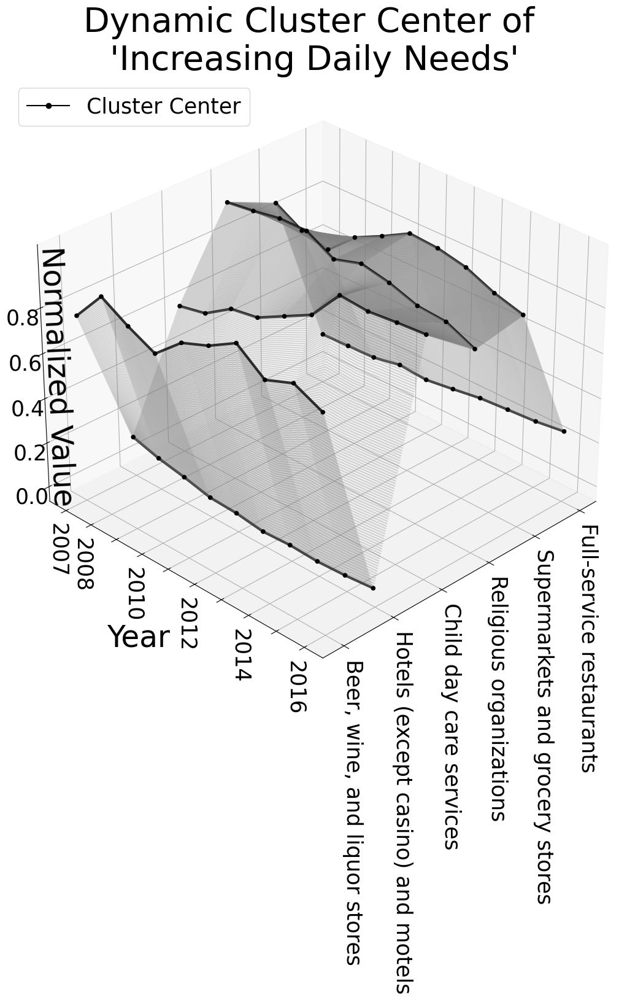

In [ ]:
plt.figure(figsize = (10,20))
hp.waterfall_plot_center(data_array = mean_samples_reshaped, sample = '3', 
cluster_label = df_cluster_label_dc.iloc[45,:])
plt.show()

We can also identify the sample with label changes in each cluster

In [116]:
n_change_dc = df_cluster_label_dc.copy()
def num_change(row):
    prev = row[0]
    count = 0
    for i in row:
        if i != prev:
            count += 1
        prev = i
    return int(count)

for ind, row in n_change_dc.iterrows():
    n_change_dc.loc[ind, 'num_change'] = num_change(row)

n_change_dc['num_change'] = n_change_dc['num_change'].astype(int)

n_change_dc = n_change_dc.sort_values(by='num_change', ascending=False)
n_change_dc.head(10)

,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,num_change
60654,0,0,0,0,0,0,0,1,1,1,1
60088,0,0,0,0,0,0,0,0,0,0,0
60644,0,0,0,0,0,0,0,0,0,0,0
60632,2,2,2,2,2,2,2,2,2,2,0
60633,0,0,0,0,0,0,0,0,0,0,0
60634,2,2,2,2,2,2,2,2,2,2,0
60636,0,0,0,0,0,0,0,0,0,0,0
60637,0,0,0,0,0,0,0,0,0,0,0
60638,0,0,0,0,0,0,0,0,0,0,0
60639,2,2,2,2,2,2,2,2,2,2,0


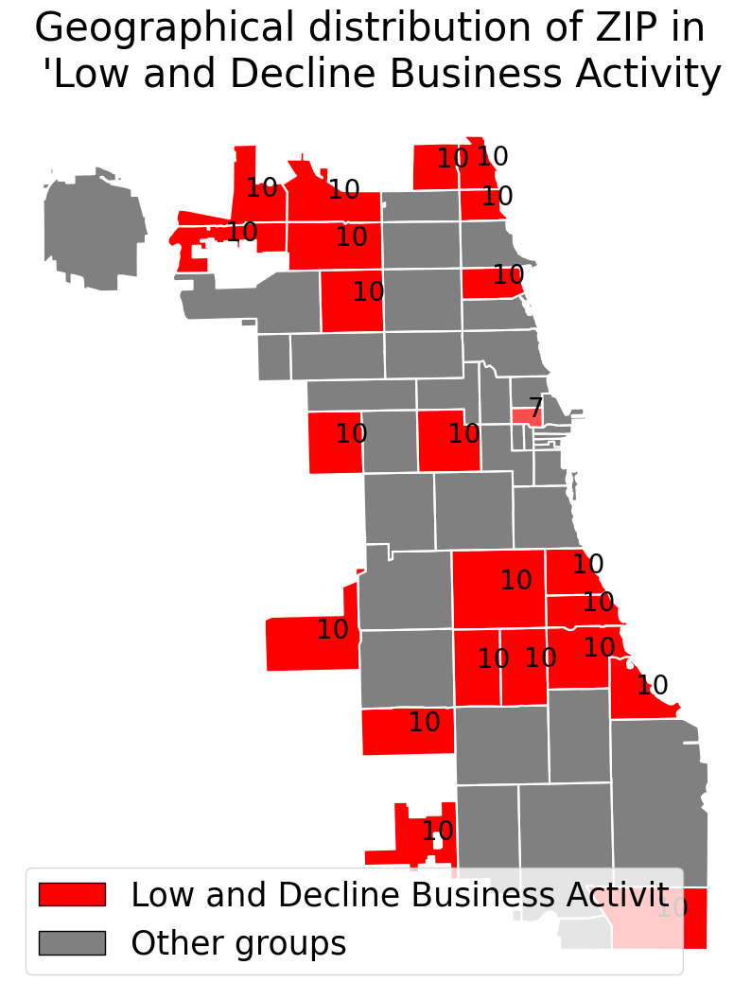

In [ ]:
cluster_name = ['\'Low and Decline Business Activity',
                '\'Stable Hotels and Restaurants',
                '\'Increasing Daily Needs']
hp.plot_sptial_distribution(chicago, 0, n_change_dc, cluster_name)
plt.show()

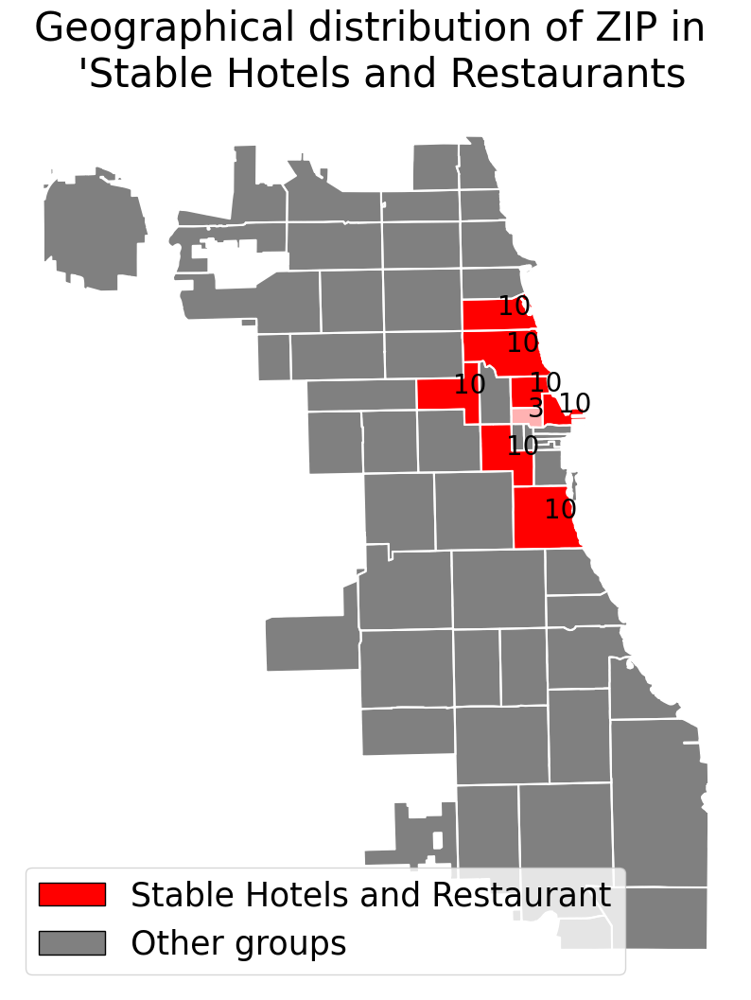

In [ ]:
hp.plot_sptial_distribution(chicago, 1, n_change_dc, cluster_name)
plt.show()

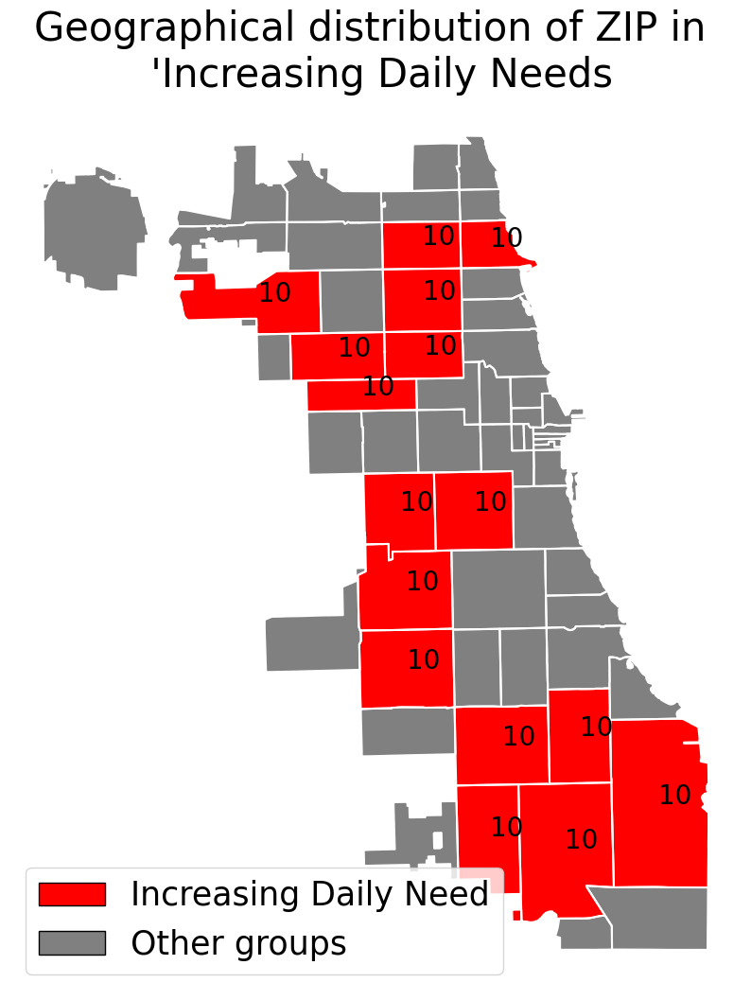

In [139]:
hp.plot_sptial_distribution(chicago, 2, n_change_dc, cluster_name)
plt.savefig('Figure14c_Increasing_Daily_Needs_by_bdc.pdf', bbox_inches='tight')

Next, we compare the atypical temporal data identified from two different appoarches: SLA with sample that changes the most, and DC with the bounded 1 changes

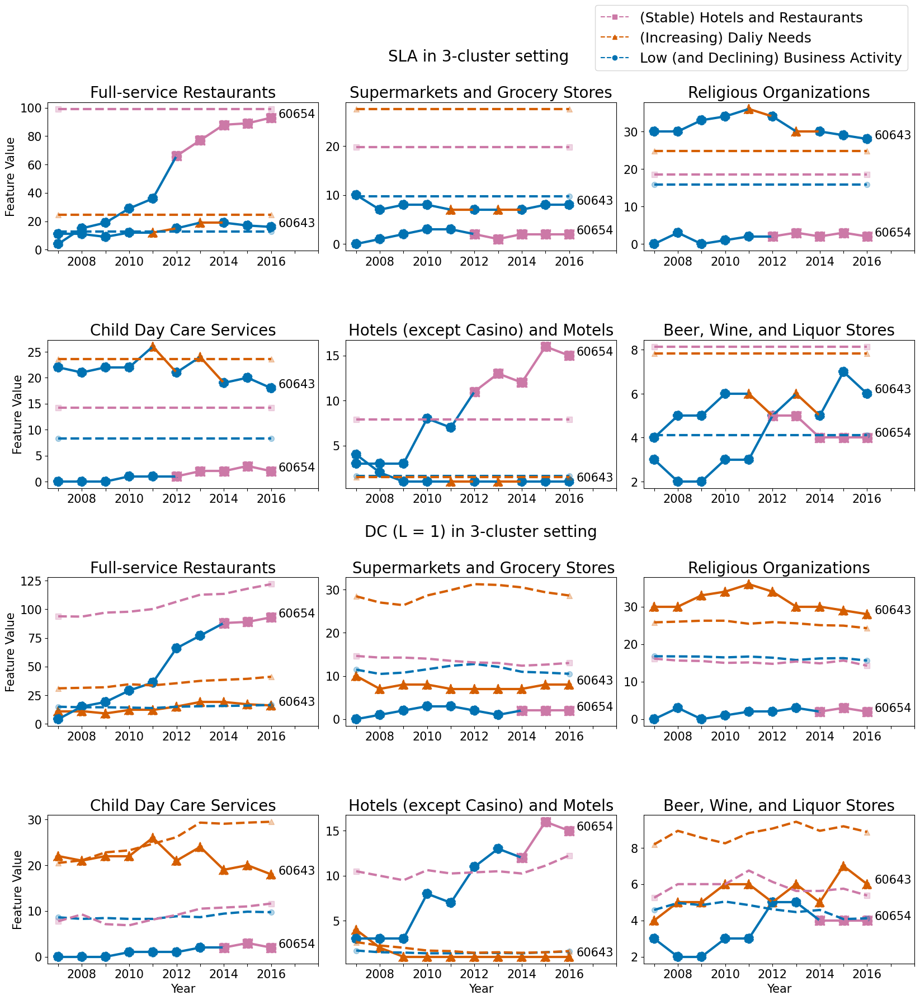

In [ ]:
cluster_center_sla_reshaped = np.zeros((3,6,10))
for i in range(3):
    for j in range(6):
        for k in range(10):
            cluster_center_sla_reshaped[i,j,k] = model_sla.cluster_centers_[i][j]

mean_samples_reshaped = np.zeros((3,6,10))
for c in range(3):
    for j in range(6):
        for t in range(10):
            mean_samples_reshaped[c,j,t] = mean_samples[j][c][t]
            
            
data_reshaped = []
for zip in range(data.shape[1]):
    current_zip = []
    for feature in range(data.shape[2]):
        current_feature = []
        for year in range(data.shape[0]):
            current_feature.append(data[year,zip,feature])
        current_zip.append(current_feature)
    data_reshaped.append(current_zip)

data_reshaped = np.array(data_reshaped)

hp.plot_comparison(data_reshaped, cluster_label2 = df_cluster_label_dc, 
                    label2 = df_cluster_label_dc.reset_index().iloc[:,-1], 
                    cluster_center2 = mean_samples_reshaped,
                    cluster_label = df_cluster_label_sla,
                    label = df_cluster_label_sla.reset_index().iloc[:,-1],
                    get_sample=['60654','60643'],
                    cluster_center = cluster_center_sla_reshaped, get_cluster = [0,2],
                    agg=np.mean,
                    get_feature = ['Full-service restaurants','Supermarkets and grocery stores',
                    'Religious organizations','Child day care services','Hotels (except casino) and motels',
                    'Beer, wine, and liquor stores'])
plt.show()

In [ ]:
_re